In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import tweepy
import json
import os
pd.options.display.max_rows # to set data to its max width in a dataframe
pd.set_option('display.max_colwidth', -1)

<ipython-input-1-fadcf1ef1142>:11: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


### Loading Files

#### 1. Archive File

In [2]:
df_archive = pd.read_csv('twitter-archive-enhanced.csv')
df_archive.head(2)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None


#### 2. Downloading predictions files from Udacity servers programatically

In [3]:
# source of the code is taken from Lesson #2 Chapter 12 Downloading Files from the Internet
foldername = 'Dog_Predictions'
if not os.path.exists(foldername):
    os.makedirs(foldername)
    
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
response = requests.get(url)
response

<Response [200]>

In [4]:
response.content

b"tweet_id\tjpg_url\timg_num\tp1\tp1_conf\tp1_dog\tp2\tp2_conf\tp2_dog\tp3\tp3_conf\tp3_dog\n666020888022790149\thttps://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg\t1\tWelsh_springer_spaniel\t0.465074\tTrue\tcollie\t0.156665\tTrue\tShetland_sheepdog\t0.0614285\tTrue\n666029285002620928\thttps://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg\t1\tredbone\t0.506826\tTrue\tminiature_pinscher\t0.07419169999999999\tTrue\tRhodesian_ridgeback\t0.07201\tTrue\n666033412701032449\thttps://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg\t1\tGerman_shepherd\t0.596461\tTrue\tmalinois\t0.13858399999999998\tTrue\tbloodhound\t0.11619700000000001\tTrue\n666044226329800704\thttps://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg\t1\tRhodesian_ridgeback\t0.408143\tTrue\tredbone\t0.360687\tTrue\tminiature_pinscher\t0.222752\tTrue\n666049248165822465\thttps://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg\t1\tminiature_pinscher\t0.560311\tTrue\tRottweiler\t0.243682\tTrue\tDoberman\t0.154629\tTrue\n666050758794694657\thttps://pbs.twimg.com/

In [5]:
with open(os.path.join(foldername, url.split('/')[-1]), mode = 'wb') as file: 
    file.write(response.content)

In [6]:
os.listdir(foldername) # to check the file is created

['image-predictions.tsv']

In [7]:
# Reading the downloaded file to a dataframe
df_prediction = pd.read_csv('image-predictions.tsv', sep = '\t')
df_prediction.head(2)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True


#### 3. Downloading Twitter Json data using Tweepy
Source: https://www.geeksforgeeks.org/python-api-get_status-in-tweepy/

In [8]:
consumer_key= 'QUKzQTMvTGIRO31jY5WaIdUcw'
consumer_secret= '6BcA40e9vcF5Oj15dFdrMV0x8YwGh2syLKPcko34WQMZbTJ8n1'
access_token= '236253458-CE0otJzVMUU6PMlklN8i2FgYsvdyRTTqIvT4sUWQ'
access_token_secret= 'SJ7WgG4f44tlhAk6Z6lEZo2IWTYESBCfpzzhyYs5uTkWB'

In [9]:
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth, wait_on_rate_limit=True, wait_on_rate_limit_notify = True)

In [10]:
# get the tweet id's to search in twitter using api

tweet_ids = list(df_archive['tweet_id'])
print ('# of tweet_ids {}'.format(len(tweet_ids)))

# create empty lists to save the tweets that are getting downloaded from twitter

tweet_list = []
tweet_err = []

for each in tweet_ids:
    try:
        tweet = api.get_status(each, tweet_mode='extended')
        tweet_list.append(tweet)
    except tweepy.TweepError as err:
        tweet_err.append(err)
        pass
        

# of tweet_ids 2356


Rate limit reached. Sleeping for: 498
Rate limit reached. Sleeping for: 500


In [11]:
tweet_list # to see the tweet data

[Status(_api=<tweepy.api.API object at 0x000001DB9C012F40>, _json={'created_at': 'Tue Aug 01 16:23:56 +0000 2017', 'id': 892420643555336193, 'id_str': '892420643555336193', 'full_text': "This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU", 'truncated': False, 'display_text_range': [0, 85], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'url': 'https://t.co/MgUWQ76dJU', 'display_url': 'pic.twitter.com/MgUWQ76dJU', 'expanded_url': 'https://twitter.com/dog_rates/status/892420643555336193/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 540, 'h': 528, 'resize': 'fit'}, 'small': {'w': 540, 'h': 528, 'resize': 'fit'}, 'large': {'w':

In [12]:
print (tweet_err) # to see the errors
print (len(tweet_err)) # to see the number of errors

[TweepError([{'code': 144, 'message': 'No status found with that ID.'}]), TweepError([{'code': 144, 'message': 'No status found with that ID.'}]), TweepError([{'code': 144, 'message': 'No status found with that ID.'}]), TweepError([{'code': 144, 'message': 'No status found with that ID.'}]), TweepError([{'code': 144, 'message': 'No status found with that ID.'}]), TweepError([{'code': 144, 'message': 'No status found with that ID.'}]), TweepError([{'code': 144, 'message': 'No status found with that ID.'}]), TweepError([{'code': 144, 'message': 'No status found with that ID.'}]), TweepError([{'code': 144, 'message': 'No status found with that ID.'}]), TweepError([{'code': 144, 'message': 'No status found with that ID.'}]), TweepError([{'code': 144, 'message': 'No status found with that ID.'}]), TweepError([{'code': 144, 'message': 'No status found with that ID.'}]), TweepError([{'code': 144, 'message': 'No status found with that ID.'}]), TweepError([{'code': 144, 'message': 'No status fo

In [13]:
# create a file and dump the tweet_list into it

json_data = 'tweet_json.txt'


with open(json_data, 'w') as outfile:
    for tweet in tweet_list:
        json.dump(tweet._json, outfile)
        outfile.write('\n')


In [14]:
# create a list for converting to pd.datafram

# Source : https://knowledge.udacity.com/questions/78063
tweetlist =[]
with open('tweet_json.txt',encoding = 'utf-8') as file:
    # use for loop to convert txt file line by line to json object
    for line in file.readlines():
        data = json.loads(line)
        tweet_id = data['id_str']
        retweet_count = data['retweet_count']
        favorite_count = data['favorite_count']
        # create dictionary and append it to list
        tweetdic = {'tweet_id': tweet_id,
                    'retweet_count': retweet_count,
                   'favorite_count': favorite_count}
        tweetlist.append(tweetdic)
# convert list to DataFram
df_json = pd.DataFrame(tweetlist)

In [396]:
df_json.head()

,tweet_id,retweet_count,favorite_count
0,892420643555336193,7249,34695
1,892177421306343426,5431,30059
2,891815181378084864,3583,22620
3,891689557279858688,7450,37944
4,891327558926688256,8007,36224


In [16]:
df_json.shape[0]

2331

## Assessment

#### In this section, we are going to assess the dataframes created in the gathering section to identify any data quality and data tidiness issues

#### In this section, we will be identifying the data quality and tidiness issues by visually and programatically

In [17]:
#### Assessing 'df_archive' first

df_archive.head(3) # reviewing the first 3 records

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,None,None,None,None


In [18]:
df_archive.tail(3)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
2353,666033412701032449,NaN,NaN,2015-11-15 23:21:54 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here is a very happy pup. Big fan of well-maintained decks. Just look at that tongue. 9/10 would cuddle af https://t.co/y671yMhoiR,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666033412701032449/photo/1,9,10,a,None,None,None,None
2354,666029285002620928,NaN,NaN,2015-11-15 23:05:30 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is a western brown Mitsubishi terrier. Upset about leaf. Actually 2 dogs here. 7/10 would walk the shit out of https://t.co/r7mOb2m0UI,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666029285002620928/photo/1,7,10,a,None,None,None,None
2355,666020888022790149,NaN,NaN,2015-11-15 22:32:08 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a Japanese Irish Setter. Lost eye in Vietnam (?). Big fan of relaxing on stair. 8/10 would pet https://t.co/BLDqew2Ijj,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666020888022790149/photo/1,8,10,None,None,None,None,None


#### NOTE: There are certain unusal letters like 'a' and 'None' in 'name' column

In [19]:
df_archive.sample(5) #random sampling to verify any issues, repeat this step to get sampling altered

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
817,770772759874076672,NaN,NaN,2016-08-30 23:58:40 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Sebastian. He's super h*ckin fluffy. That's really all you need to know. 11/10 would snug intensely https://t.co/lqr0NdtwQo,NaN,NaN,NaN,https://twitter.com/dog_rates/status/770772759874076672/photo/1,11,10,Sebastian,None,None,None,None
325,833863086058651648,NaN,NaN,2017-02-21 02:17:06 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Bentley. Hairbrushes are his favorite thing in the h*ckin world. 12/10 impawsible to say no to https://t.co/HDloTYilWZ,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/833863086058651648/photo/1,https://twitter.com/dog_rates/status/833863086058651648/photo/1",12,10,Bentley,None,None,None,None
2116,670427002554466305,NaN,NaN,2015-11-28 02:20:27 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is a Deciduous Trimester mix named Spork. Only 1 ear works. No seat belt. Incredibly reckless. 9/10 still cute https://t.co/CtuJoLHiDo,NaN,NaN,NaN,https://twitter.com/dog_rates/status/670427002554466305/photo/1,9,10,a,None,None,None,None
1082,738883359779196928,NaN,NaN,2016-06-04 00:01:35 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",When a single soap orb changes your entire perception of the universe... 10/10 https://t.co/9eCXpVExJc,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/738883359779196928/photo/1,https://twitter.com/dog_rates/status/738883359779196928/photo/1",10,10,None,None,None,None,None
2011,672245253877968896,NaN,NaN,2015-12-03 02:45:32 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Meet Snickers. He's adorable. Also comes in t-shirt mode. 12/10 I would aggressively caress Snickers https://t.co/aCRKDaFmVr,NaN,NaN,NaN,https://twitter.com/dog_rates/status/672245253877968896/photo/1,12,10,Snickers,None,None,None,None


In [20]:
df_archive.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

In [21]:
df_archive[df_archive['rating_denominator'] !=10].shape[0] # per introduction, the denominator always equal to 10

23

In [22]:
df_archive[df_archive['rating_numerator']<= 10].shape[0]

901

### Visual Assessment Notes
#### Quality: 
- There are lot of missing values such as 'in_reply_to_status_id' and 'in_reply_to_user_id'. This indicates not all tweets have replies. there are only 78 replies
- data type of 'timestamp' and 'retweeted_status_timestamp' is incorrect. It should be converted to 'datetime'
- There are 181 retweets such as 'retweeted_status_id', 'retweeted_status_user_id' and 'retweeted_status_timestamp'
- There are missing urls in 'expanded_urls' column
- Tweet_id is showing as integer. It should be converted to txt since we dont use it in our analysis
- There are 23 'rating_denominator' that are not equal to 10

#### Tidiness: 
- The 4 different columns doggo, floofer, pupper and puppo, are all relative to the same variable that identifies the stage of dog. So, we can melt these columns into a single column named "dog stage"




In [23]:
sum(df_archive.duplicated()) # There are 0 duplicated tweets

0

In [24]:
df_prediction.head(10)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,Bernese_mountain_dog,0.651137,True,English_springer,0.263788,True,Greater_Swiss_Mountain_dog,0.016199,True
6,666051853826850816,https://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg,1,box_turtle,0.933012,False,mud_turtle,0.045885,False,terrapin,0.017885,False
7,666055525042405380,https://pbs.twimg.com/media/CT5N9tpXIAAifs1.jpg,1,chow,0.692517,True,Tibetan_mastiff,0.058279,True,fur_coat,0.054449,False
8,666057090499244032,https://pbs.twimg.com/media/CT5PY90WoAAQGLo.jpg,1,shopping_cart,0.962465,False,shopping_basket,0.014594,False,golden_retriever,0.007959,True
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,miniature_poodle,0.201493,True,komondor,0.192305,True,soft-coated_wheaten_terrier,0.082086,True


In [25]:
df_prediction.tail(10)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
2065,890240255349198849,https://pbs.twimg.com/media/DFrEyVuW0AAO3t9.jpg,1,Pembroke,0.511319,True,Cardigan,0.451038,True,Chihuahua,0.029248,True
2066,890609185150312448,https://pbs.twimg.com/media/DFwUU__XcAEpyXI.jpg,1,Irish_terrier,0.487574,True,Irish_setter,0.193054,True,Chesapeake_Bay_retriever,0.118184,True
2067,890729181411237888,https://pbs.twimg.com/media/DFyBahAVwAAhUTd.jpg,2,Pomeranian,0.566142,True,Eskimo_dog,0.178406,True,Pembroke,0.076507,True
2068,890971913173991426,https://pbs.twimg.com/media/DF1eOmZXUAALUcq.jpg,1,Appenzeller,0.341703,True,Border_collie,0.199287,True,ice_lolly,0.193548,False
2069,891087950875897856,https://pbs.twimg.com/media/DF3HwyEWsAABqE6.jpg,1,Chesapeake_Bay_retriever,0.425595,True,Irish_terrier,0.116317,True,Indian_elephant,0.076902,False
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True
2074,892420643555336193,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1,orange,0.097049,False,bagel,0.085851,False,banana,0.076110,False


#### 1. There are quite number of dogs are predicted incorrectly
#### 2. The predicted dog names in p1, p2 and p3 are not in uniform format meaning first letter is capitalized for few and few are not. it should be converted to lower case to bring the uniformitly

In [26]:
df_prediction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


#### 1. Tweet_id is showing as integet. It should be converted to string
#### 2. comparitively there are 278 tweets missing between archive and predictions file


In [27]:
df_json.head(5)

,tweet_id,retweet_count,favorite_count
0,892420643555336193,7249,34695
1,892177421306343426,5431,30059
2,891815181378084864,3583,22620
3,891689557279858688,7450,37944
4,891327558926688256,8007,36224


In [28]:
df_json.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2331 entries, 0 to 2330
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   tweet_id        2331 non-null   object
 1   retweet_count   2331 non-null   int64 
 2   favorite_count  2331 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 54.8+ KB


#### comparitively there are 26 tweets missing between archive and json file

In [29]:
df_json.describe()

,retweet_count,favorite_count
count,2331.000000,2331.000000
mean,2556.981553,7243.677821
std,4325.185766,11249.683825
min,1.000000,0.000000
25%,518.500000,1255.500000
50%,1189.000000,3138.000000
75%,2965.500000,8851.500000
max,73307.000000,148897.000000


### Assessment Summary

### Quality: 

##### Archive:

1. Tweet ID field should be an object data type, not integers or floats because they are not numeric and aren't intended to perform calculations. 

2. Dog Names : In the name column, there are several values that are not dog names, like 'a', 'the', 'such', etc. Notice that all of these observations have lowercase characters, an important pattern that could be used to clean up this field. Another way is to drop duplicated values 

3. There are lot of missing values such as 'in_reply_to_status_id' and 'in_reply_to_user_id'. This indicates not all tweets have replies. there are only 78 replies

4. data type of 'timestamp' and 'retweeted_status_timestamp' is incorrect. It should be converted to 'datetime'

5. There are 181 retweets such as 'retweeted_status_id', 'retweeted_status_user_id' and 'retweeted_status_timestamp'

6. There are missing urls in 'expanded_urls' column

7. There are 23 'rating_denominator' that are not equal to 10

#### Predictions:

8. Tweet_id is showing as integet. It should be converted to string

##### Json:

10. There are 26 missing values


### Tidiness: 

#### Archive: 
1.	The 4 different columns doggo, floofer, pupper and puppo, are all relative to the same variable that identifies the stage of dog. So, we can melt these columns into a single column named "dog stage"

#### Prediction and Json: 
2.	Identify the best predicted breed type based on confidence and create two new columns with breed and confidence


3. The df2 and df3 are part of the same observational unit as df1 but there are three separate tables so they should be merged and stored in a file called twitter_archive_master.csv, as per project instructions.

## Cleaning

##### In this section, I will be cleaning the data quality issues and data tidiness issues assessed in the assessment process using Define, Code and Test

In [286]:
#### take copies of each dataframe for cleaning. So, the original datasets will not be disturbed

df_archive_clean = df_archive.copy()
df_prediction_clean = df_prediction.copy()
df_json_clean = df_json.copy()


### 1. ID fields: The ID fields, like tweet_id, in_reply_to_status_id etc. should be objects

#### Define: Tweet ID fields: This field should be objects, not integers or floats because #### this is not numeric and aren't intended to perform calculations.

Note: The other ID fileds are untouched because they are anyways removed in subsequent steps

#### Code:

In [287]:
df_archive_clean['tweet_id'] = df_archive_clean['tweet_id'].astype(str)


#### Test:

In [288]:
df_archive_clean.info() # this confirm the ID columns have been converted to object datatype

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   object 
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

#### 2.	Dog Names : In the name column, there are several values that are not dog names, like 'a', 'the', 'such', etc. Notice that all of these observations have lowercase characters, an important pattern that could be used to clean up this field. Another way is to drop duplicated values

#### Define:
     Identifying the names that are non-dog names and rename them in df_archive

#### Code:

In [289]:
lower_name = df_archive_clean['name'].str.contains('^[a-z]', regex=True)
print (df_archive_clean[lower_name]['name'].value_counts().sort_index()) # There are total 25 unique names
print (sum(df_archive_clean[lower_name]['name'].value_counts().sort_index())) # there are total 109 that are not names

a               55
actually        2 
all             1 
an              7 
by              1 
getting         2 
his             1 
incredibly      1 
infuriating     1 
just            4 
life            1 
light           1 
mad             2 
my              1 
not             2 
officially      1 
old             1 
one             4 
quite           4 
space           1 
such            1 
the             8 
this            1 
unacceptable    1 
very            5 
Name: name, dtype: int64
109


In [290]:
df_archive_clean.loc[lower_name, 'name'] = 'NotName' #Rename these lower case names as 'NotName'

#### Code

In [291]:
len(df_archive_clean[df_archive_clean['name']== 'NotName']) #Confirm the change is succeeded

109

In [292]:
lower_name = df_archive_clean['name'].str.contains('^[a-z]', regex=True)
df_archive_clean[lower_name]['name'].value_counts().sort_index() #The out is empty due to no lower case names in the name column

Series([], Name: name, dtype: int64)

#### 3. There are lot of missing values such as 'in_reply_to_status_id' and 'in_reply_to_user_id'. This indicates not all tweets have replies. there are only 78 replies

#### Define

Per the introduction, it is understood that we are only interested to consider the original tweets, not the retweets.
So, they can be dropped

#### Code

In [293]:
df_archive_clean = df_archive_clean[df_archive_clean['in_reply_to_status_id'].isna()]

#### Test

In [294]:
df_archive_clean.info() #this confirm the 'tweet replies' have been dropped

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2278 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2278 non-null   object 
 1   in_reply_to_status_id       0 non-null      float64
 2   in_reply_to_user_id         0 non-null      float64
 3   timestamp                   2278 non-null   object 
 4   source                      2278 non-null   object 
 5   text                        2278 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2274 non-null   object 
 10  rating_numerator            2278 non-null   int64  
 11  rating_denominator          2278 non-null   int64  
 12  name                        2278 non-null   object 
 13  doggo                       2278 

#### 4.	data type of 'timestamp' and 'retweeted_status_timestamp' is incorrect. It should be converted to 'datetime'

#### Define

The datatypes for timestamp and retweeted_status_timestamp needs to be corrected to datetime format

#### Code

In [295]:
df_archive_clean['timestamp'] = pd.to_datetime(df_archive_clean['timestamp'])
df_archive_clean['retweeted_status_timestamp'] = pd.to_datetime(df_archive_clean['retweeted_status_timestamp'])

#### Test

In [296]:
df_archive_clean.info() # it confirm the timestamp dtype has been converted to datetime

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2278 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2278 non-null   object             
 1   in_reply_to_status_id       0 non-null      float64            
 2   in_reply_to_user_id         0 non-null      float64            
 3   timestamp                   2278 non-null   datetime64[ns, UTC]
 4   source                      2278 non-null   object             
 5   text                        2278 non-null   object             
 6   retweeted_status_id         181 non-null    float64            
 7   retweeted_status_user_id    181 non-null    float64            
 8   retweeted_status_timestamp  181 non-null    datetime64[ns, UTC]
 9   expanded_urls               2274 non-null   object             
 10  rating_numerator            2278 non-null   int64           

#### 5.	There are 181 retweets such as 'retweeted_status_id', 'retweeted_status_user_id' and 'retweeted_status_timestamp'


#### Define

There are 181 retweets. As per the project introduction, we are only interested to consider the original tweets. 
They need to be dropped

#### Code

In [297]:
df_archive_clean = df_archive_clean[df_archive_clean['retweeted_status_id'].isna()]

In [298]:
df_archive_clean.info() ### this confirm the retweets are dropped

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2097 non-null   object             
 1   in_reply_to_status_id       0 non-null      float64            
 2   in_reply_to_user_id         0 non-null      float64            
 3   timestamp                   2097 non-null   datetime64[ns, UTC]
 4   source                      2097 non-null   object             
 5   text                        2097 non-null   object             
 6   retweeted_status_id         0 non-null      float64            
 7   retweeted_status_user_id    0 non-null      float64            
 8   retweeted_status_timestamp  0 non-null      datetime64[ns, UTC]
 9   expanded_urls               2094 non-null   object             
 10  rating_numerator            2097 non-null   int64           

### 6.	There are missing urls in 'expanded_urls' column

#### Define
There are 59 missing values in 'expanded_urls'. They need to be verified and dropped. However, during the cleaning process, the are already 56 missing expanded_urls rows dropped. so, the resultant missing values are only 3

#### Code

In [299]:
df_archive_clean = df_archive_clean[df_archive_clean['expanded_urls'].notnull()]

#### Test

In [300]:
df_archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2094 non-null   object             
 1   in_reply_to_status_id       0 non-null      float64            
 2   in_reply_to_user_id         0 non-null      float64            
 3   timestamp                   2094 non-null   datetime64[ns, UTC]
 4   source                      2094 non-null   object             
 5   text                        2094 non-null   object             
 6   retweeted_status_id         0 non-null      float64            
 7   retweeted_status_user_id    0 non-null      float64            
 8   retweeted_status_timestamp  0 non-null      datetime64[ns, UTC]
 9   expanded_urls               2094 non-null   object             
 10  rating_numerator            2094 non-null   int64           

In [301]:
df_archive_clean.head(2)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaT,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaT,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None


### 7.	There are 23 'rating_denominator' that are not equal to 10

#### Define

as per introduction about archive file, it is told that the denominators are always equal to 10. 
Here, we are trying to identifying rating_denominators that are not equal to 10

#### Code

In [302]:
df_archive_clean = df_archive_clean[df_archive_clean['rating_denominator'] == 10]

#### Test

In [303]:
df_archive_clean.info() ### This confirms that the rating_denominators that are not equal to 10 got dropped

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2077 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2077 non-null   object             
 1   in_reply_to_status_id       0 non-null      float64            
 2   in_reply_to_user_id         0 non-null      float64            
 3   timestamp                   2077 non-null   datetime64[ns, UTC]
 4   source                      2077 non-null   object             
 5   text                        2077 non-null   object             
 6   retweeted_status_id         0 non-null      float64            
 7   retweeted_status_user_id    0 non-null      float64            
 8   retweeted_status_timestamp  0 non-null      datetime64[ns, UTC]
 9   expanded_urls               2077 non-null   object             
 10  rating_numerator            2077 non-null   int64           

In [304]:
df_archive_clean.head(2)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaT,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaT,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None


### 8. Predictions File :Tweet_id is showing as integer. It should be converted to string

#### Define

Tweet_id in the predictions file has to be converted to string since this is not useful in analysis

#### Code

In [305]:
df_prediction_clean['tweet_id'] = df_prediction_clean['tweet_id'].astype(str)

#### Test

In [306]:
df_prediction_clean.info() ### this confirms that the datatype has been converted to string

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   object 
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(1), object(5)
memory usage: 152.1+ KB


### 9. Json - Quality: There are 26 missing values in df_json

#### Define
The missing values in the df_json file are due to the errors that are removed from df_archive file. Hence, no action is needed

### Tidiness:
#### df_archive file:
#### 1. The 4 different columns doggo, floofer, pupper and puppo, are all relative to the same variable that identifies the stage of dog. So, we can melt these columns into a single column named "dog stage"

#### Define:
There are 4 columns for dog stages which should be melted to one column for data analysis

and identify the multi stage rows and created one column



#### Code:

In [307]:
df_archive_clean.head(2)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaT,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaT,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None


In [308]:
# doggo, floofer, pupper, puppo
# source: https://knowledge.udacity.com/questions/111929
df_archive_clean['doggo'] = df_archive_clean['doggo'].replace('None', "")
df_archive_clean['floofer'] = df_archive_clean['floofer'].replace('None', "")
df_archive_clean['pupper'] = df_archive_clean['pupper'].replace('None', "")
df_archive_clean['puppo'] = df_archive_clean['puppo'].replace('None', "")
df_archive_clean['dog_stage'] = df_archive_clean['doggo']+df_archive_clean['floofer']+df_archive_clean['pupper']+df_archive_clean['puppo']

In [309]:
# handle multiple stages
df_archive_clean.loc[df_archive_clean.dog_stage == 'doggopupper', 'dog_stage'] = 'doggo, pupper'
df_archive_clean.loc[df_archive_clean.dog_stage == 'doggopuppo', 'dog_stage'] = 'doggo, puppo'
df_archive_clean.loc[df_archive_clean.dog_stage == 'doggofloofer', 'dog_stage'] = 'doggo, floofer'

In [310]:
# handle missing values
df_archive_clean.loc[df_archive_clean.dog_stage == '', 'dog_stage'] = np.nan

#### Test

In [311]:
df_archive_clean.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,dog_stage
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaT,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,,,,,NaN
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaT,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,,,,,NaN
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,NaN,NaN,NaT,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,,,,,NaN
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,NaN,NaN,NaT,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13,10,Darla,,,,,NaN
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",NaN,NaN,NaT,"https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12,10,Franklin,,,,,NaN


In [312]:
df_archive_clean['dog_stage'].value_counts()

pupper            220
doggo             72 
puppo             23 
floofer           9  
doggo, pupper     9  
doggo, floofer    1  
doggo, puppo      1  
Name: dog_stage, dtype: int64

### Tidiness | Predictions

#### 2. Identify the best predicted breed type based on confidence and create two new columns with breed and confidence

#### Define:
    There are three predictions of breeds with different prediction confidences. We need to find the best among the three
    take the highest predicted breed type and the correspondant confidence and create two columns with these values

#### Code:

In [313]:
# Source: https://github.com/stephanderton/We-Rate-Dogs-Data-Wrangling-Project/blob/master/wrangle_act.ipynb

# setup the conditions for selection
conditions = [(df_prediction_clean['p1_dog'] == True),
              (df_prediction_clean['p2_dog'] == True),
              (df_prediction_clean['p3_dog'] == True)]

# set the choice order based on the selection conditions for predicted breed
choices_breed = [df_prediction_clean['p1'], 
                 df_prediction_clean['p2'],
                 df_prediction_clean['p3']]

# set the choice order for confidence level based on the selection conditions
choices_confidence = [df_prediction_clean['p1_conf'], 
                      df_prediction_clean['p2_conf'], 
                      df_prediction_clean['p3_conf']]

# select the predicted breed based on the first successful condition
df_prediction_clean['breed'] = np.select(conditions, choices_breed, 
                                       default = 'none')

# select the predicted confidence level based on the first successful condition
df_prediction_clean['confidence'] = np.select(conditions, choices_confidence, 
                                            default = 0)

#### test:

In [314]:
df_prediction_clean.head(2)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,breed,confidence
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True,Welsh_springer_spaniel,0.465074
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True,redbone,0.506826


### Tidiness | Archive, Prediction and Json files

3. The df_Prediction_clean and df_json_clean are part of the same observational unit as df_archive_clean but there are three separate tables so they should be merged and
stored in a file called twitter_archive_master.csv, as per project instructions.

In [315]:
df_archive_clean = pd.merge(df_archive_clean, df_prediction_clean, on = 'tweet_id', how = 'left')
df_archive_clean = pd.merge(df_archive_clean, df_json_clean, on = 'tweet_id', how = 'left')


In [316]:
df_prediction_clean.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,breed,confidence
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True,Welsh_springer_spaniel,0.465074
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True,redbone,0.506826
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True,German_shepherd,0.596461
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True,Rhodesian_ridgeback,0.408143
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True,miniature_pinscher,0.560311


In [317]:
df_archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2077 entries, 0 to 2076
Data columns (total 33 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2077 non-null   object             
 1   in_reply_to_status_id       0 non-null      float64            
 2   in_reply_to_user_id         0 non-null      float64            
 3   timestamp                   2077 non-null   datetime64[ns, UTC]
 4   source                      2077 non-null   object             
 5   text                        2077 non-null   object             
 6   retweeted_status_id         0 non-null      float64            
 7   retweeted_status_user_id    0 non-null      float64            
 8   retweeted_status_timestamp  0 non-null      datetime64[ns, UTC]
 9   expanded_urls               2077 non-null   object             
 10  rating_numerator            2077 non-null   int64           

#### Additional cleaning
After merging, 
- retweet_count, favorite_count are converted to float. this should be fixed

- dog_stages to be converted from string to category

#### Define

fill all NaN to 0 using fillna() method and use to_numeric to convert float to int

#### Code:

In [410]:
df_archive_clean['retweet_count'] = df_archive_clean['retweet_count'].fillna(0)
df_archive_clean['favorite_count'] = df_archive_clean['favorite_count'].fillna(0)

In [413]:
df_archive_clean['retweet_count'] = df_archive_clean['retweet_count'].astype(int)
df_archive_clean['favorite_count'] = df_archive_clean['favorite_count'].astype(int)

#### Test:

In [416]:
df_archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2077 entries, 0 to 2076
Data columns (total 33 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2077 non-null   object             
 1   in_reply_to_status_id       0 non-null      float64            
 2   in_reply_to_user_id         0 non-null      float64            
 3   timestamp                   2077 non-null   datetime64[ns, UTC]
 4   source                      2077 non-null   object             
 5   text                        2077 non-null   object             
 6   retweeted_status_id         0 non-null      float64            
 7   retweeted_status_user_id    0 non-null      float64            
 8   retweeted_status_timestamp  0 non-null      datetime64[ns, UTC]
 9   expanded_urls               2077 non-null   object             
 10  rating_numerator            2077 non-null   object          

#### Define:
dog_stage columns is in string format, this needs to be converted into category as there are finite number of breeds

#### Code:

In [417]:
df_archive_clean['dog_stage'] = df_archive_clean['dog_stage'].astype('category')

#### Test: 

In [329]:
df_archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2077 entries, 0 to 2076
Data columns (total 33 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2077 non-null   object             
 1   in_reply_to_status_id       0 non-null      float64            
 2   in_reply_to_user_id         0 non-null      float64            
 3   timestamp                   2077 non-null   datetime64[ns, UTC]
 4   source                      2077 non-null   object             
 5   text                        2077 non-null   object             
 6   retweeted_status_id         0 non-null      float64            
 7   retweeted_status_user_id    0 non-null      float64            
 8   retweeted_status_timestamp  0 non-null      datetime64[ns, UTC]
 9   expanded_urls               2077 non-null   object             
 10  rating_numerator            2077 non-null   int64           

### Addtional Cleaning suggested by mentor about rating:

#### Define : Some of the rating values are not properly extracted from the tweets.

#### Code:

In [357]:
rating = df_archive_clean.text.str.extract('((?:\d+\.)?\d+)\/(\d+)', expand=True)
rating.columns = ['rating_numerator', 'rating_denominator']

df_archive_clean['rating_numerator'] = rating['rating_numerator']

#### Test: 

In [377]:
df_archive_clean[['text','rating_numerator', 'rating_denominator']].sample(5)

,text,rating_numerator,rating_denominator
1217,This is just a beautiful pupper good shit evolution. 12/10 https://t.co/2L8pI0Z2Ib,12,10
2071,This is a truly beautiful English Wilson Staff retriever. Has a nice phone. Privileged. 10/10 would trade lives with https://t.co/fvIbQfHjIe,10,10
2053,Here we have a mixed Asiago from the Galápagos Islands. Only one ear working. Big fan of marijuana carpet. 8/10 https://t.co/tltQ5w9aUO,8,10
1822,"""To bone or not to bone?""\n10/10 https://t.co/4g5kFdxp6g",10,10
954,Meet Sid &amp; Murphy. Murphy floats alongside Sid and whispers motivational quotes in his ear. Magical af. Both 11/10 https://t.co/7mmjyearQW,11,10


### Storing data into 'twitter_archive_master.csv'

In [418]:
df_archive_clean.to_csv('twitter_archive_master.csv')

### Data Analysis and Visualization

In this data analysis and visualization process, i am going to use various columns such ratings, dog_stages, breed, retweet and favourite tweets counts

In [420]:
# let us take a copy of df_archive_clean

df_archive_final = df_archive_clean.copy()
df_archive_final.head(2)


,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,...,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,breed,confidence,retweet_count,favorite_count
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaT,https://twitter.com/dog_rates/status/892420643555336193/photo/1,...,bagel,0.085851,False,banana,0.076110,False,none,0.000000,7249,34695
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaT,https://twitter.com/dog_rates/status/892177421306343426/photo/1,...,Pekinese,0.090647,True,papillon,0.068957,True,Chihuahua,0.323581,5431,30059


In [421]:
df_archive_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2077 entries, 0 to 2076
Data columns (total 33 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2077 non-null   object             
 1   in_reply_to_status_id       0 non-null      float64            
 2   in_reply_to_user_id         0 non-null      float64            
 3   timestamp                   2077 non-null   datetime64[ns, UTC]
 4   source                      2077 non-null   object             
 5   text                        2077 non-null   object             
 6   retweeted_status_id         0 non-null      float64            
 7   retweeted_status_user_id    0 non-null      float64            
 8   retweeted_status_timestamp  0 non-null      datetime64[ns, UTC]
 9   expanded_urls               2077 non-null   object             
 10  rating_numerator            2077 non-null   object          

In [422]:
df_archive_final.describe() # to see the summary statistics

,in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,rating_denominator,img_num,p1_conf,p2_conf,p3_conf,confidence,retweet_count,favorite_count
count,0.0,0.0,0.0,0.0,2077.0,1954.000000,1954.000000,1.954000e+03,1.954000e+03,1954.000000,2077.000000,2077.000000
mean,NaN,NaN,NaN,NaN,10.0,1.202149,0.594065,1.348960e-01,6.010819e-02,0.465256,2377.687049,7984.278286
std,NaN,NaN,NaN,NaN,0.0,0.559401,0.272336,1.011622e-01,5.080867e-02,0.339580,4174.142777,11639.443642
min,NaN,NaN,NaN,NaN,10.0,1.000000,0.044333,1.011300e-08,1.740170e-10,0.000000,0.000000,0.000000
25%,NaN,NaN,NaN,NaN,10.0,1.000000,0.362656,5.361625e-02,1.598680e-02,0.140228,524.000000,1743.000000
50%,NaN,NaN,NaN,NaN,10.0,1.000000,0.587440,1.175870e-01,4.947920e-02,0.460157,1151.000000,3629.000000
75%,NaN,NaN,NaN,NaN,10.0,1.000000,0.846897,1.962177e-01,9.155483e-02,0.775645,2715.000000,9993.000000
max,NaN,NaN,NaN,NaN,10.0,4.000000,1.000000,4.880140e-01,2.710420e-01,0.999956,73307.000000,148897.000000


In [423]:
# to see the count of each dog_stage
df_archive_final[['dog_stage']].value_counts()

dog_stage     
pupper            220
doggo             72 
puppo             23 
doggo, pupper     9  
floofer           9  
doggo, floofer    1  
doggo, puppo      1  
dtype: int64

Text(0.5, 1.0, 'Dog_Stages Vs Count')

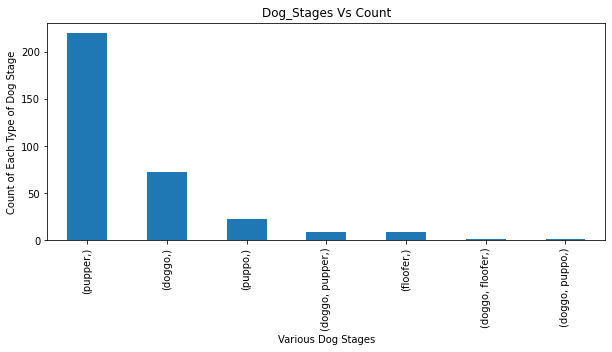

In [431]:
# to see the count of each dog_stage visually
df_archive_final[['dog_stage']].value_counts().plot(kind='bar', figsize=(10,4))
plt.xlabel('Various Dog Stages')
plt.ylabel('Count of Each Type of Dog Stage')
plt.title('Dog_Stages Vs Count')


<AxesSubplot:xlabel='p1_dog,p2_dog,p3_dog'>

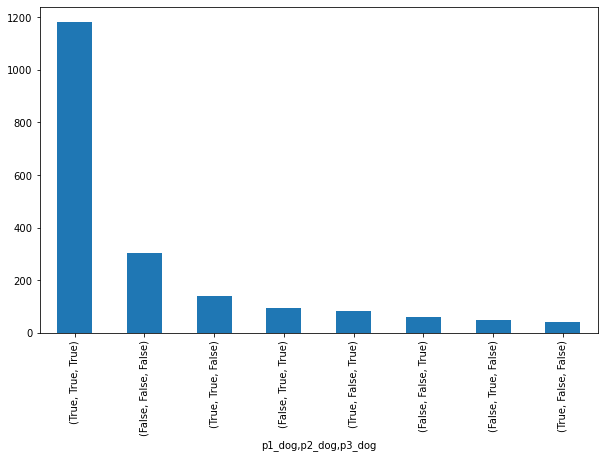

In [425]:
#### to see the number of dogs that are predicted correctly together and its combinations
df_archive_final[['p1_dog', 'p2_dog', 'p3_dog']].value_counts().plot(kind='bar', figsize=(10,6))

Text(0, 0.5, 'number of tweets')

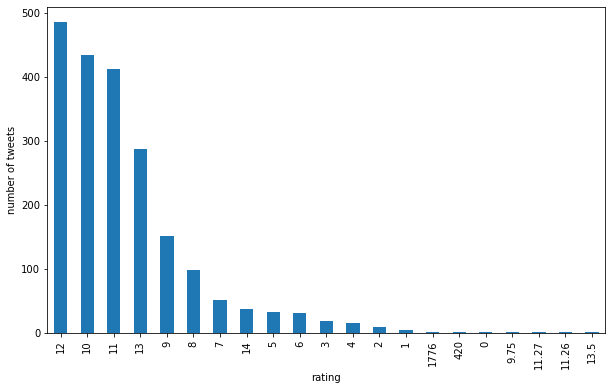

In [426]:
# to visualize the number of tweets per rating
df_archive_final['rating_numerator'].value_counts().plot(kind='bar', figsize=(10,6))
plt.xlabel('rating')
plt.ylabel('number of tweets')

#### Most of the rating tht fallen between 9 to 12

In [427]:
# to see the top 10 favourite tweets
df_archive_final.sort_values(by = 'favorite_count', ascending=False).head(10)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,...,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,breed,confidence,retweet_count,favorite_count
820,744234799360020481,NaN,NaN,2016-06-18 18:26:18+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here's a doggo realizing you can stand in a pool. 13/10 enlightened af (vid by Tina Conrad) https://t.co/7wE9LTEXC4,NaN,NaN,NaT,https://twitter.com/dog_rates/status/744234799360020481/video/1,...,ice_bear,0.044681,False,whippet,0.018442,True,Labrador_retriever,0.825333,73307,148897
324,822872901745569793,NaN,NaN,2017-01-21 18:26:02+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here's a super supportive puppo participating in the Toronto #WomensMarch today. 13/10 https://t.co/nTz3FtorBc,NaN,NaN,NaT,https://twitter.com/dog_rates/status/822872901745569793/photo/1,...,Labrador_retriever,0.160329,True,Irish_terrier,0.069126,True,Lakeland_terrier,0.196015,41365,127479
416,807106840509214720,NaN,NaN,2016-12-09 06:17:20+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Stephan. He just wants to help. 13/10 such a good boy https://t.co/DkBYaCAg2d,NaN,NaN,NaT,https://twitter.com/dog_rates/status/807106840509214720/video/1,...,Pomeranian,0.120358,True,toy_terrier,0.077008,True,Chihuahua,0.505370,53510,115062
115,866450705531457537,NaN,NaN,2017-05-22 00:28:40+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Jamesy. He gives a kiss to every other pupper he sees on his walk. 13/10 such passion, much tender https://t.co/wk7TfysWHr",NaN,NaN,NaT,"https://twitter.com/dog_rates/status/866450705531457537/photo/1,https://twitter.com/dog_rates/status/866450705531457537/photo/1",...,Boston_bull,0.078060,True,pug,0.001771,True,French_bulldog,0.905334,31267,111712
858,739238157791694849,NaN,NaN,2016-06-04 23:31:25+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here's a doggo blowing bubbles. It's downright legendary. 13/10 would watch on repeat forever (vid by Kent Duryee) https://t.co/YcXgHfp1EC,NaN,NaN,NaT,https://twitter.com/dog_rates/status/739238157791694849/video/1,...,Siberian_husky,0.390413,True,malamute,0.080901,True,Eskimo_dog,0.503372,54680,110240
60,879415818425184262,NaN,NaN,2017-06-26 19:07:24+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Duddles. He did an attempt. 13/10 someone help him (vid by Georgia Felici) https://t.co/UDT7ZkcTgY,NaN,NaN,NaT,https://twitter.com/dog_rates/status/879415818425184262/video/1,...,Boston_bull,0.134967,True,Cardigan,0.110481,True,English_springer,0.383404,38590,95351
348,819004803107983360,NaN,NaN,2017-01-11 02:15:36+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Bo. He was a very good First Doggo. 14/10 would be an absolute honor to pet https://t.co/AdPKrI8BZ1,NaN,NaN,NaT,"https://twitter.com/dog_rates/status/819004803107983360/photo/1,https://twitter.com/dog_rates/status/819004803107983360/photo/1,https://twitter.com/dog_rates/status/819004803107983360/photo/1,https://twitter.com/dog_rates/status/819004803107983360/photo/1",...,toy_poodle,0.271929,True,Tibetan_terrier,0.094759,True,standard_poodle,0.351308,35672,84832
141,859196978902773760,NaN,NaN,2017-05-02 00:04:57+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",We only rate dogs. This is quite clearly a smol broken polar bear. We'd appreciate if you only send dogs. Thank you... 12/10 https://t.co/g2nSyGenG9,NaN,NaN,NaT,https://twitter.com/dog_rates/status/859196978902773760/video/1,...,malamute,0.216163,True,Persian_cat,0.128383,False,malamute,0.216163,27164,82746
99,870374049280663552,NaN,NaN,2017-06-01 20

Text(0.5, 1.0, 'Top 5 dog breed predictions')

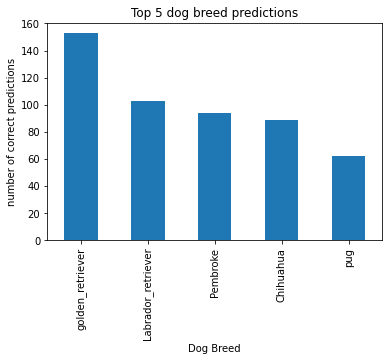

In [428]:
### to see the top 5 predicted dogs

df_archive_final[df_archive_final['breed'] != 'none']['breed'].value_counts().head(5).plot(kind='bar')
plt.xlabel('Dog Breed')
plt.ylabel('number of correct predictions')
plt.title('Top 5 dog breed predictions')


In [429]:
# to see which breed has got more tweets


df_archive_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2077 entries, 0 to 2076
Data columns (total 33 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2077 non-null   object             
 1   in_reply_to_status_id       0 non-null      float64            
 2   in_reply_to_user_id         0 non-null      float64            
 3   timestamp                   2077 non-null   datetime64[ns, UTC]
 4   source                      2077 non-null   object             
 5   text                        2077 non-null   object             
 6   retweeted_status_id         0 non-null      float64            
 7   retweeted_status_user_id    0 non-null      float64            
 8   retweeted_status_timestamp  0 non-null      datetime64[ns, UTC]
 9   expanded_urls               2077 non-null   object             
 10  rating_numerator            2077 non-null   object          

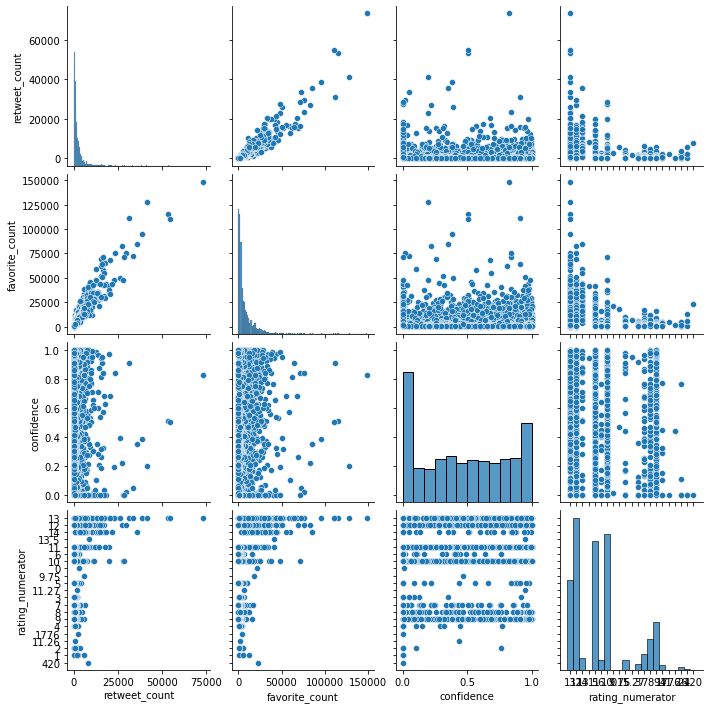

In [430]:
# Pairplot using seaborn to see how they are correlated to each other

sns.pairplot(df_archive_final, vars = ['retweet_count','favorite_count', 'confidence', 'rating_numerator'])

from the above pairplot, its understood that the favorite_count and retweet_counts appears to be positively correlated